In [1]:
import os

#HUSK!, vælg jupyter lab version 4.2.5 når jeg starter run,
#4 folders, MEG_data, notebooks_fMRI, notebooks_MEG, student_folders

path='/work/student_folders/Ida_D_folder/notebooks_fMRI' # Remember to change this to your own path
os.chdir(path)
!./activate.sh

Installed kernelspec virt_env in /home/ucloud/.local/share/jupyter/kernels/virt_env
Done! Remember changing the kernel in Jupyter.


In [1]:
# %% IMPORTS OF PACKAGES

from os.path import join

import matplotlib.pyplot as plt
import mne
import pandas as pd
import numpy as np

import glob

plt.ion()  # toggle interactive plotting
# import numpy as np

Matplotlib is building the font cache; this may take a moment.


In [3]:
# Concatenate the 2 fif files for session a and B

from mne.io import concatenate_raws, read_raw_fif


# Concatenating the 2 fif files from run A and run B of our participant Ida
data_path = '/MEG_data/0143/20240924_000000/MEG/'
n_files = 2
file_1 = '/work/MEG_data/0143/20240924_000000/MEG/001.sessA/files/sessA.fif'
file_2 = '/work/MEG_data/0143/20240924_000000/MEG/005.sessB/files/sessB.fif'
#fnames = [data_path + f"sessA{b+1}.fif" for b in range(n_files)]
fnames = [file_1,file_2]
fnames

raws = [read_raw_fif(fname, verbose="error", on_split_missing="ignore") for fname in fnames]  # ignore filename warnings
raws

# Overwrite raw[1]._cals with raw[0]._cals
raws[1]._cals = raws[0]._cals

#now raw has 2 files 
raw = concatenate_raws(raws, on_mismatch='ignore')

#save
output_filename = '/work/student_folders/Ida_D_folder/notebooks_MEG/Portfolio_3/sessA+B.fif'
raw.save(output_filename)    

Writing /work/student_folders/Ida_D_folder/notebooks_MEG/Portfolio_3/sessA_B.fif


/tmp/ipykernel_587/1502989404.py:22: RuntimeWarning: raw files do not all have the same data format, could result in precision mismatch. Setting raw.orig_format="unknown"
  raw = concatenate_raws(raws, on_mismatch='ignore')
/tmp/ipykernel_587/1502989404.py:26: RuntimeWarning: This filename (/work/student_folders/Ida_D_folder/notebooks_MEG/Portfolio_3/sessA_B.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(output_filename)


Closing /work/student_folders/Ida_D_folder/notebooks_MEG/Portfolio_3/sessA_B.fif
[done]


In [4]:
# %% READ RAW DATA
#fname = join(meg_path, raw_name)
raw = mne.io.read_raw_fif('/work/student_folders/Ida_D_folder/notebooks_MEG/Portfolio_3/sessA+B.fif', preload=True)

Opening raw data file /work/student_folders/Ida_D_folder/notebooks_MEG/Portfolio_3/sessA+B.fif...


/tmp/ipykernel_587/4104806108.py:3: RuntimeWarning: This filename (/work/student_folders/Ida_D_folder/notebooks_MEG/Portfolio_3/sessA+B.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif('/work/student_folders/Ida_D_folder/notebooks_MEG/Portfolio_3/sessA+B.fif', preload=True)


    Read a total of 9 projection items:
        planar-Raw-0.000-120.000-PCA-01 (1 x 203)  idle
        planar-Raw-0.000-120.000-PCA-02 (1 x 203)  idle
        planar-Raw-0.000-120.000-PCA-03 (1 x 203)  idle
        axial-Raw-0.000-120.000-PCA-01 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-02 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-03 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-04 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-05 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-06 (1 x 102)  idle
    Range : 259000 ... 1704999 =    259.000 ...  1704.999 secs
Ready.
Reading 0 ... 1445999  =      0.000 ...  1445.999 secs...


In [5]:
print(raw.info)

<Info | 24 non-empty values
 acq_pars: ACQactiveGround 1 ACQch.BIO001.gain 2000 ACQch.BIO001.highpass ...
 bads: []
 ch_names: EOG001, EOG002, ECG003, IASX+, IASX-, IASY+, IASY-, IASZ+, ...
 chs: 2 EOG, 1 ECG, 11 Internal Active Shielding data (Triux systems), 102 Magnetometers, 204 Gradiometers, 1 misc, 1 Stimulus, 1 System status channel information (Triux systems)
 custom_ref_applied: False
 description: TRIUX system at Aarhus-3103
 dev_head_t: MEG device -> head transform
 dig: 116 items (3 Cardinal, 4 HPI, 109 Extra)
 events: 1 item (list)
 experimenter: Andreas Hojlund (hojlund)
 file_id: 4 items (dict)
 gantry_angle: 68.0
 highpass: 0.1 Hz
 hpi_meas: 1 item (list)
 hpi_results: 1 item (list)
 hpi_subsystem: 3 items (dict)
 line_freq: 50.0
 lowpass: 330.0 Hz
 meas_date: 2024-09-24 08:53:08 UTC
 meas_id: 4 items (dict)
 nchan: 323
 proj_id: 1 item (ndarray)
 proj_name: cogsci_teaching
 projs: planar-Raw-0.000-120.000-PCA-01: off, planar- ...
 sfreq: 1000.0 Hz
 subject_info: 6 item

Using matplotlib as 2D backend.


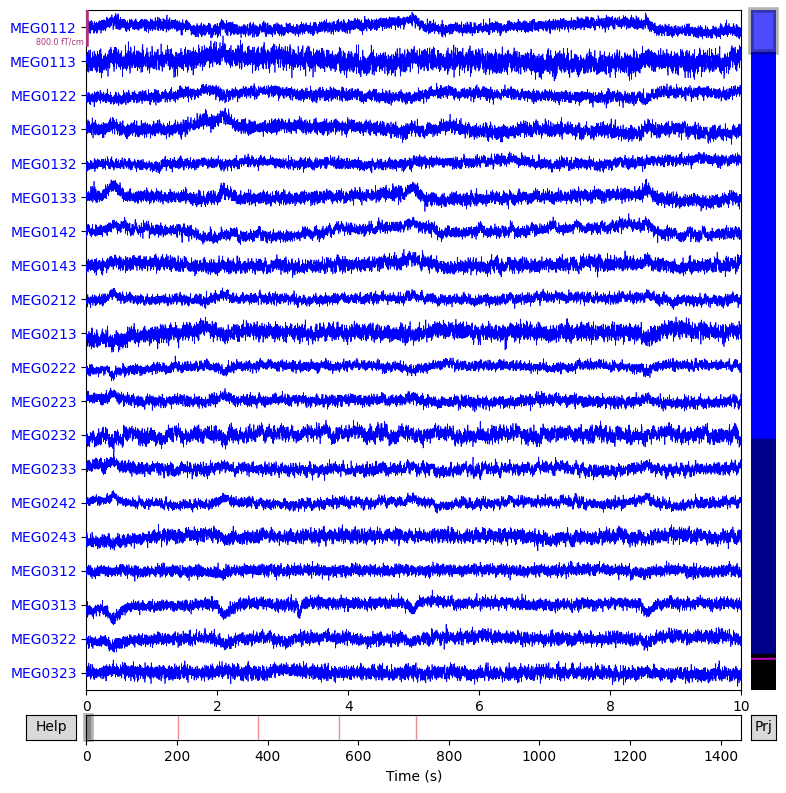

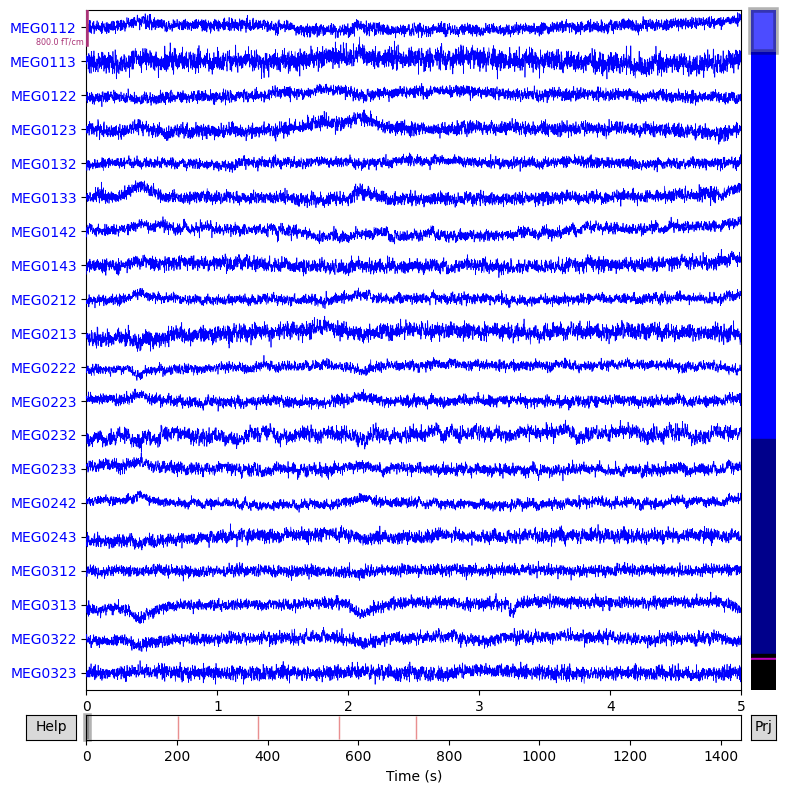

Effective window size : 2.048 (s)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 60 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  64 | elapsed:    2.9s remaining:    7.5s
[Parallel(n_jobs=-1)]: Done  31 out of  64 | elapsed:    3.0s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  44 out of  64 | elapsed:    3.0s remaining:    1.4s
[Parallel(n_jobs=-1)]: Done  57 out of  64 | elapsed:    3.0s remaining:    0.4s


Plotting power spectral density (dB=True).


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    3.1s finished


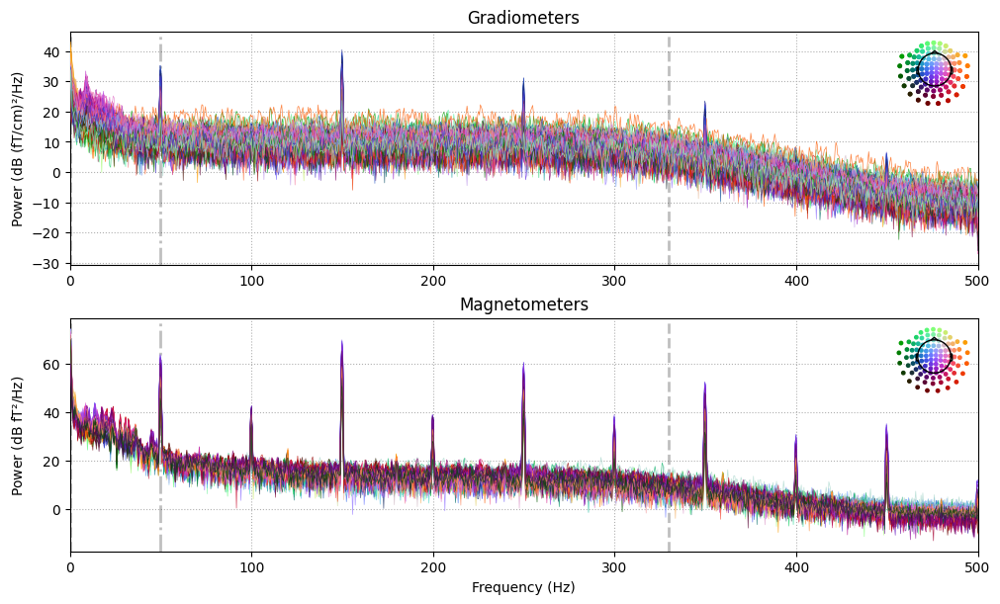

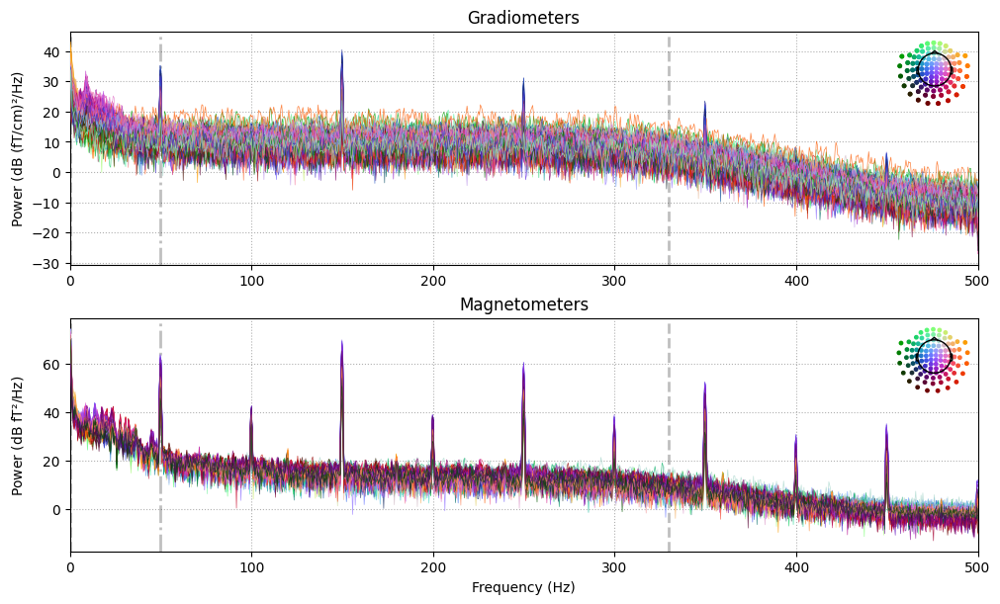

In [6]:
# %% PLOT THE RAW DATA TO GET A FIRST IMPRESSION
raw.plot();   ## what happens after 10 seconds?
raw.plot(start=0, duration=5, n_channels=20);  ## and after 5s? 
#raw.plot(start=20, duration=20, n_channels=20);  
#raw.compute_psd(n_jobs=-1).plot()
raw.compute_psd(n_jobs=-1, tmax=9).plot()

#You can play around with the parameters and find more information and ideas about plotting here: 
#https://mne.tools/stable/auto_tutorials/raw/40_visualize_raw.html#sphx-glr-auto-tutorials-raw-40-visualize-raw-py

In [7]:
# %% FILTER RAW
#You can see that the recorded frequencies go up to 500 Hz. The high frequencies are not of interest to us, so we will filter the data to only contain the lower frequencies.
# Apply a low-pass filter at 40 Hz (i.e., everything below 40 Hz passes through the filter)
raw.filter(l_freq=None, h_freq=40, n_jobs=4)  # alters raw in-place



Filtering raw data in 5 contiguous segments
Setting up low-pass filter at 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 331 samples (0.331 s)



[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  36 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 252 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Done 306 out of 306 | elapsed:    8.1s finished


<Raw | sessA+B.fif, 323 x 1446000 (1446.0 s), ~3.48 GB, data loaded>

Effective window size : 2.048 (s)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 60 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  64 | elapsed:    6.2s remaining:   15.9s
[Parallel(n_jobs=-1)]: Done  31 out of  64 | elapsed:    8.8s remaining:    9.3s
[Parallel(n_jobs=-1)]: Done  44 out of  64 | elapsed:   11.6s remaining:    5.3s
[Parallel(n_jobs=-1)]: Done  57 out of  64 | elapsed:   13.5s remaining:    1.7s


Plotting power spectral density (dB=True).


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:   14.1s finished


Effective window size : 2.048 (s)


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 60 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  64 | elapsed:    3.1s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done  31 out of  64 | elapsed:    5.3s remaining:    5.7s
[Parallel(n_jobs=-1)]: Done  44 out of  64 | elapsed:    7.2s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  57 out of  64 | elapsed:    8.9s remaining:    1.1s


Plotting power spectral density (dB=True).


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    9.7s finished


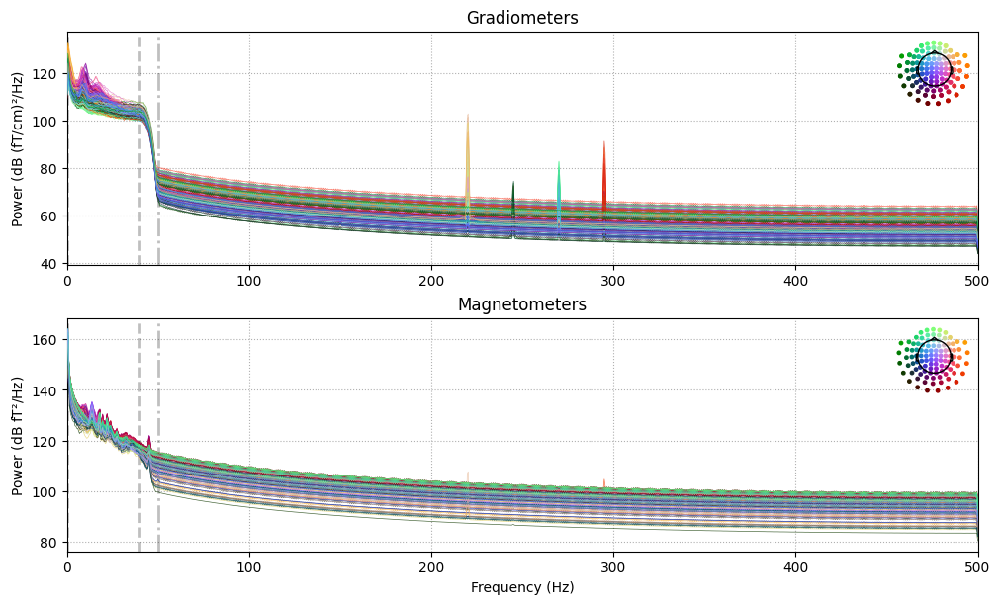

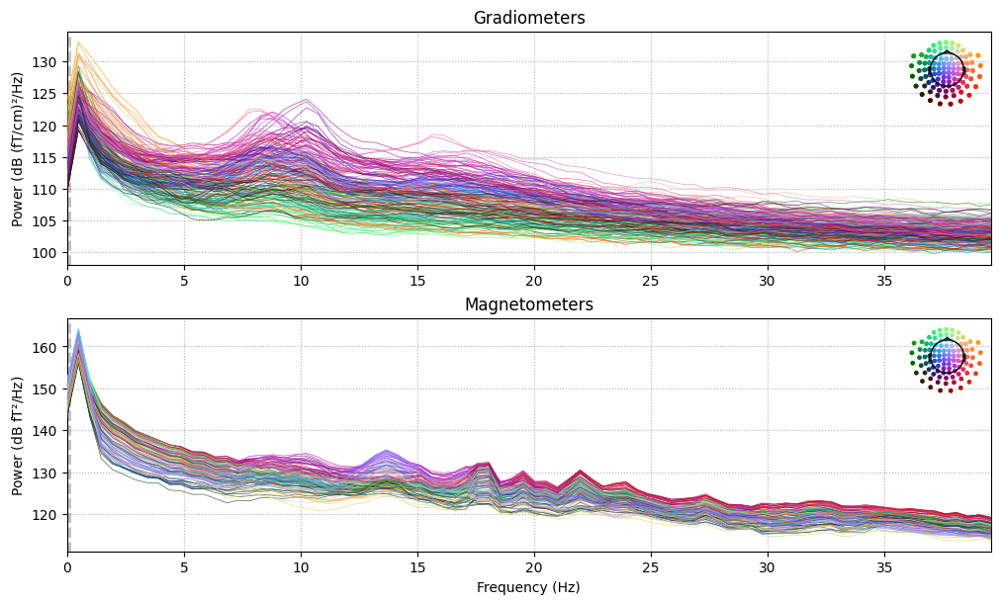

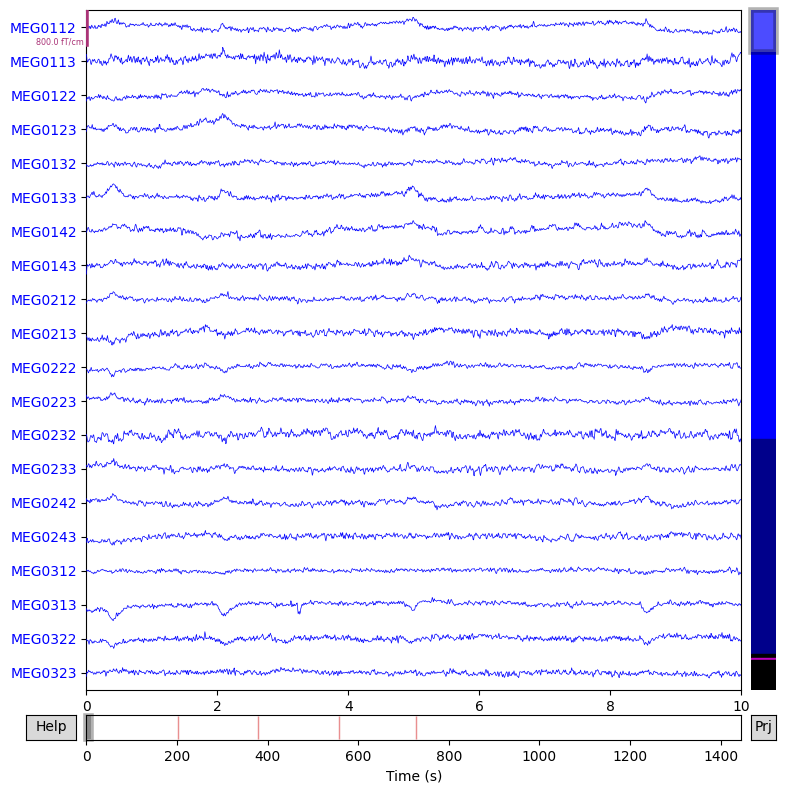

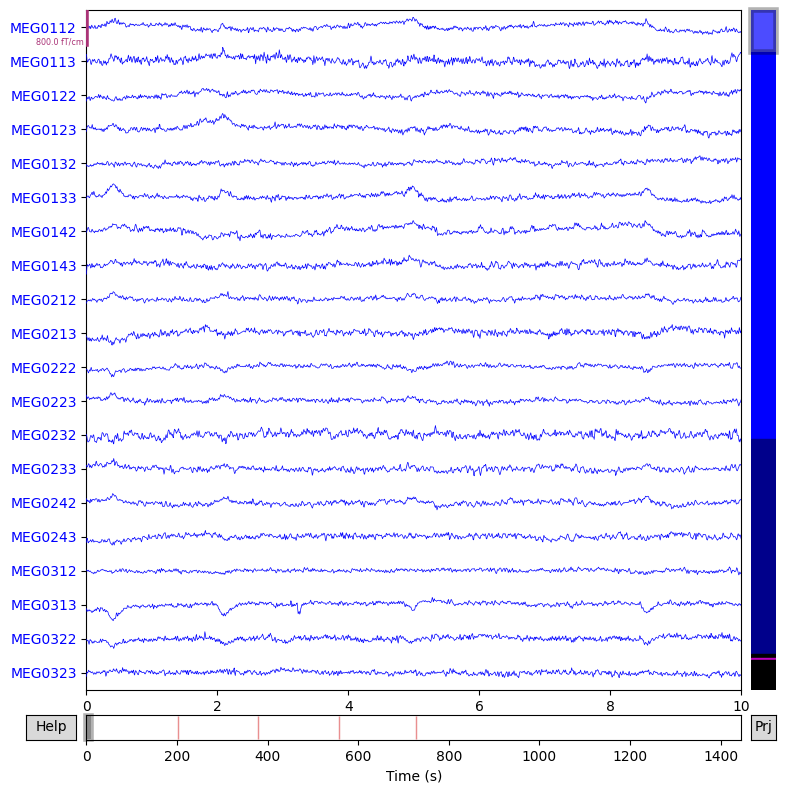

In [8]:
#%% And now look at the filtered data

raw.compute_psd(n_jobs=-1).plot()
# Zoom in on the frequencies between 0 and 40 Hz
raw.compute_psd(n_jobs=-1,fmax=40).plot()
raw.plot()

In [9]:
# %% FIND EVENTS

events = mne.find_events(raw, min_duration=0.002, consecutive=True)  ## returns a numpy array

# due to the online filtering of the MEG data, the square waves that constitute the trigger values 
# in the STI101-channel are sometimes not read very well during this process - and therefore we'll 
# only focus on those triggers that correspond to trigger values that we know are relevant
trigger_vals = [1,2,3,4,110,120,130,140,210,211,220,221,230,231,240,241]
true_events = events[np.isin(events[:,2], trigger_vals),:]

# unfortunately, the STI101-channel is really acting up in this dataset, and therefore multiple of the 
# relevant triggers are sometimes read as repeated values within a few milliseconds... gotta fix that too
# We identify for which rows the difference between two consecutive trigger values is 0 (i.e. they're identical 
# - cuz that shouldn't ever happen (check the event_id to (maybe) make sense of this)
repeat_idx = np.where(np.diff(true_events[:,2])==0)[0]
repeat_idx2 = repeat_idx+1 # we need the index of both the first and the second value in those pairs (it's only the second of the two that we delete)
repeat_combined = [[i, j] for i, j in zip(repeat_idx, repeat_idx2)] # we group indices in pairs for printing

# print to inspect if needed
#print(cropped_events[repeat_combined, 2])
#print(cropped_events[repeat_combined, :])

cropped_events = np.delete(true_events, repeat_idx2, axis=0)



3530 events found on stim channel STI101
Event IDs: [  1   2   3   4  11  12  13  14  15 110 120 126 130 134 140 156 210 211
 220 221 230 231 238 239 240 241 243 246 247 252 254 255]


In [10]:
print(len(events))
print(len(cropped_events))

3530
937


/tmp/ipykernel_587/1871443732.py:2: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  mne.viz.plot_events(cropped_events, sfreq=raw.info["sfreq"]);  ## #%% SEGMENT DATA INTO EPOCHS


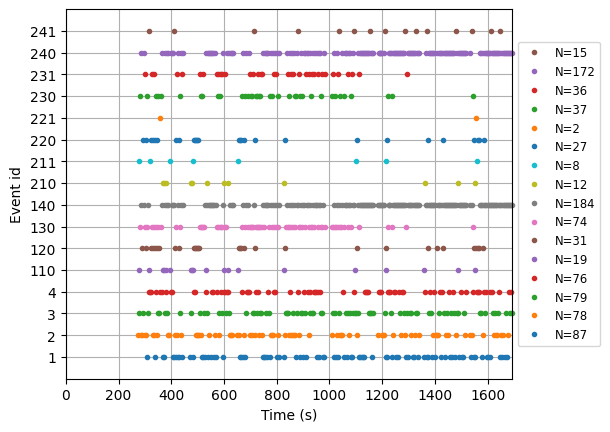

In [11]:
#mne.viz.plot_events(events)  ## samples on x-axis
mne.viz.plot_events(cropped_events, sfreq=raw.info["sfreq"]);  ## #%% SEGMENT DATA INTO EPOCHS

In [12]:
# Do we have 160*2 deck-screens, deck-selection and win-/loss-screens?
print(len(cropped_events[cropped_events[:,2]<10,2]))
print(len(cropped_events[(cropped_events[:,2]>100) & (cropped_events[:,2]<150), 2]))
print(len(cropped_events[(cropped_events[:,2]>200) & (cropped_events[:,2]<250), 2]))

320
308
309


In [13]:
# loading in the logfiles
# Define variables
log_path = '/work/MEG_data/logfiles'
sess_prefix = '143'  # Prefix for matching

# Use glob to match all files starting with the prefix
log_files = glob.glob(join(log_path, f"{sess_prefix}*"))


df_load = []
for lf in np.sort(log_files):
    print(lf)
    df_load.append(pd.read_csv(join(log_path, lf)))
                        
df = pd.concat(df_load)



/work/MEG_data/logfiles/143A_sess_1 (2024-09-24 10-57-42).csv
/work/MEG_data/logfiles/143A_sess_2 (2024-09-24 11-03-07).csv
/work/MEG_data/logfiles/143A_sess_3 (2024-09-24 11-07-11).csv
/work/MEG_data/logfiles/143A_sess_4 (2024-09-24 11-11-54).csv
/work/MEG_data/logfiles/143B_sess_1 (2024-09-24 11-17-41).csv
/work/MEG_data/logfiles/143B_sess_2 (2024-09-24 11-20-36).csv
/work/MEG_data/logfiles/143B_sess_3 (2024-09-24 11-23-31).csv
/work/MEG_data/logfiles/143B_sess_4 (2024-09-24 11-26-25).csv


In [14]:
# cleaning the concatenated logfiles a bit

df_cropped = df.drop(['ID', 'dur_measured_decks', 'offset_decks', 'exp_type', 'offset_win'], axis=1) # throwing out columns with all NaN
df_cropped['deck_marked'] = df_cropped['init_mark'] + 1 # adjusting the indexing of "init_mark" to reflect actual deck-number rather than python index


In [15]:
# quick glance at the deck-screen-labels
df_cropped[['init_mark', 'deck_marked', 'deck_select', 'n_moves']]

,init_mark,deck_marked,deck_select,n_moves
0,1,2,1,3
1,2,3,3,0
2,1,2,4,2
3,1,2,2,0
4,2,3,4,1
...,...,...,...,...
35,1,2,4,2
36,3,4,4,0
37,2,3,4,1
38,3,4,4,0


In [16]:
# fixing the few deck-screen labels that were messed up due to the trigger values from button presses happening before the screen appearing
print(df_cropped[['deck_marked']].T.to_numpy()[0])
print(cropped_events[cropped_events[:,2]<10,2])

[2 3 2 2 3 2 2 1 3 4 4 4 2 2 1 4 2 3 3 4 4 1 1 3 4 3 2 2 4 4 1 1 2 1 2 1 1
 3 2 1 1 3 1 4 4 2 2 2 2 3 2 1 1 3 1 4 3 1 2 1 4 4 1 2 1 4 3 2 4 3 1 4 4 3
 4 4 3 2 2 2 2 2 1 1 4 1 2 1 3 4 4 4 2 2 3 3 2 4 3 4 2 3 3 2 1 1 1 3 1 4 3
 1 2 2 2 4 4 1 2 1 1 2 3 3 3 2 4 2 2 3 2 2 1 3 4 2 1 3 3 1 4 3 1 4 2 4 3 3
 3 4 4 4 1 4 1 4 3 3 1 1 2 3 1 3 1 2 1 3 2 2 2 4 1 3 1 3 2 3 1 1 3 4 3 3 2
 3 1 1 1 1 1 4 4 4 4 3 3 3 1 3 2 4 4 4 2 2 2 3 1 1 4 4 4 3 1 2 4 4 1 1 4 3
 2 4 4 3 2 1 3 1 3 3 2 1 1 2 3 3 1 2 1 4 1 1 3 4 3 1 2 4 1 2 2 2 3 4 1 4 3
 1 2 3 2 4 1 3 1 4 3 1 2 3 3 1 4 1 1 3 2 4 2 1 2 4 1 1 4 4 4 3 3 1 2 4 3 4
 1 1 4 1 4 3 2 3 2 2 3 4 1 2 1 2 1 3 1 2 4 3 4 3]
[2 3 2 2 3 2 2 1 3 4 4 4 2 2 1 4 2 3 3 4 4 1 1 3 4 3 2 2 4 4 1 1 2 1 2 1 1
 3 2 1 1 3 1 4 4 2 2 2 2 3 2 1 1 3 1 4 3 1 2 1 4 4 1 2 1 4 3 2 4 3 1 4 4 3
 4 4 3 2 2 2 2 2 1 1 4 1 2 1 3 4 4 4 2 2 3 3 2 4 3 4 2 3 3 2 1 1 1 3 1 4 3
 1 2 2 2 4 4 1 2 1 1 2 3 3 3 2 4 2 2 3 2 2 1 3 4 2 1 3 3 1 4 3 1 4 2 4 3 3
 3 4 4 4 1 4 1 4 3 3 1 1 2 3 1 3 1 2 1 3 2 2 2 4 1

In [17]:
#This is the structure of interesting triggers / events
event_id = {'Visual/Deck/One': 1, # Decks presented, deck 1 marked
            'Visual/Deck/Two': 2, # Deck 2 marked
            'Visual/Deck/Three': 3, # Deck 3 marked
            'Visual/Deck/Four': 4, # Deck 4 marked
            'Visual/Win/One': 210, # Win screen, deck 1
            'Visual/Win/Two': 220, # Win screen, deck 2
            'Visual/Win/Three': 230, # Win screen, deck 3
            'Visual/Win/Four': 240, # Win screen, deck 4
            'Visual/Loss/One': 211, # Loss screen, deck 1
            'Visual/Loss/Two': 221, # Loss screen, deck 2
            'Visual/Loss/Three': 231, # Loss screen, deck 3
            'Visual/Loss/Four': 241, # Loss screen, deck 4
            'Response/Switch/First': 11, # y button press (switch), first
            'Response/Switch/Second': 12, # y button press, second
            'Response/Switch/Third': 13, # y button press, third
            'Response/Switch/Fourth': 14, # y button press, fourth
            'Response/Select/One': 110, # b button press (select), deck 1
            'Response/Select/Two': 120, # b button press, deck 2
            'Response/Select/Three': 130, # b button press, deck 3
            'Response/Select/Four': 140, # b button press, deck 4
              }   


In [18]:
#Segment the data into epochs
#Epochs can be rejected, if the signal exceeds the range that is expected. Read more here: https://mne.tools/stable/generated/mne.Epochs.html#mne.Epochs
# reject = dict(mag=4e-12, grad=4000e-13, eog=250e-6) # T, T/m, V   #You can try it out
reject = None    #Otherwise, all epochs are kept
#Create the epochs around the events. tmin is the time before the event, and tmax the time after the event.
epochs = mne.Epochs(
    raw,
    events,
    event_id,
    on_missing='warn',   #only report on missing events in data, but continue script
    tmin=-0.200,
    tmax=1.000,
    baseline=(None, 0),
    reject=reject,
    preload=True,
    proj=False,
)  ## have proj True, if you wanna reject


Not setting metadata
2107 matching events found
Setting baseline interval to [-0.2, 0.0] s
Applying baseline correction (mode: mean)
Created an SSP operator (subspace dimension = 9)
Using data from preloaded Raw for 2107 events and 1201 original time points ...
0 bad epochs dropped


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


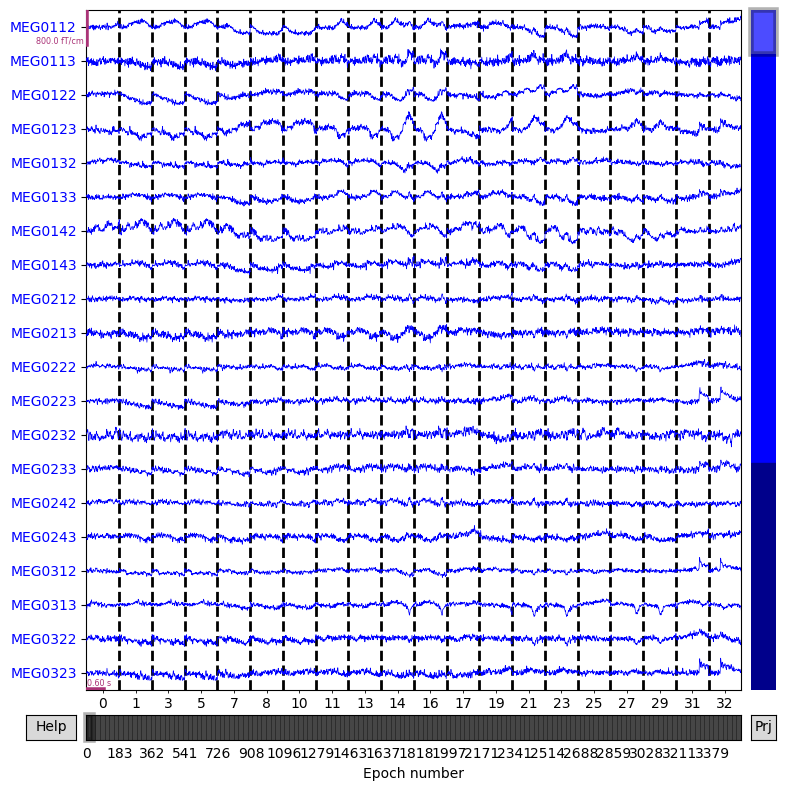

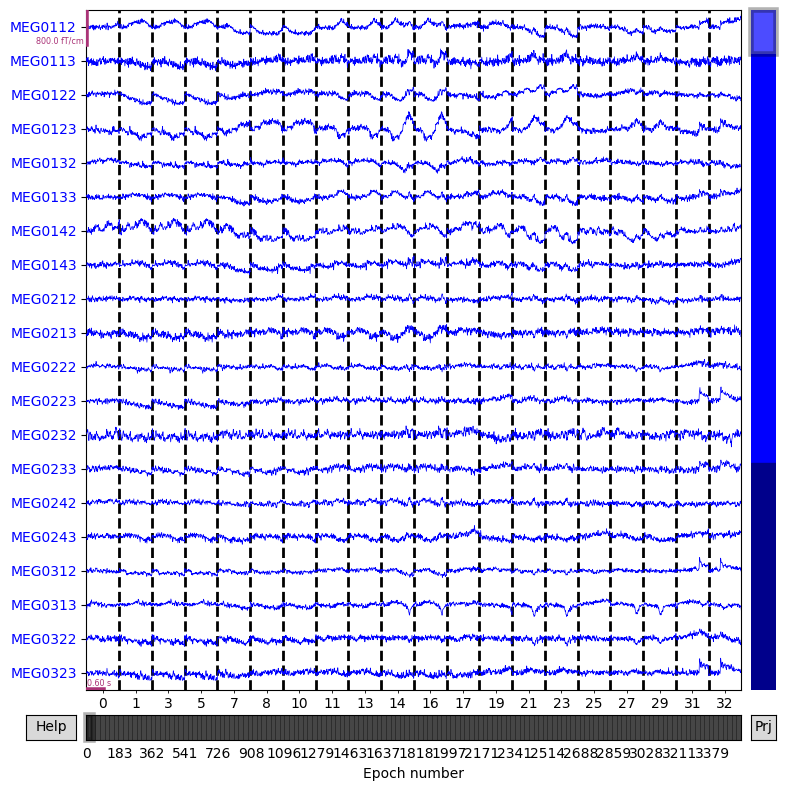

In [19]:
#Pick only MEG channels
epochs.pick_types(meg=True, eog=False, ias=False, emg=False, misc=False, stim=False, syst=False)

#show the epochs
epochs.plot()

In [20]:
event_id

{'Visual/Deck/One': 1,
 'Visual/Deck/Two': 2,
 'Visual/Deck/Three': 3,
 'Visual/Deck/Four': 4,
 'Visual/Win/One': 210,
 'Visual/Win/Two': 220,
 'Visual/Win/Three': 230,
 'Visual/Win/Four': 240,
 'Visual/Loss/One': 211,
 'Visual/Loss/Two': 221,
 'Visual/Loss/Three': 231,
 'Visual/Loss/Four': 241,
 'Response/Switch/First': 11,
 'Response/Switch/Second': 12,
 'Response/Switch/Third': 13,
 'Response/Switch/Fourth': 14,
 'Response/Select/One': 110,
 'Response/Select/Two': 120,
 'Response/Select/Three': 130,
 'Response/Select/Four': 140}

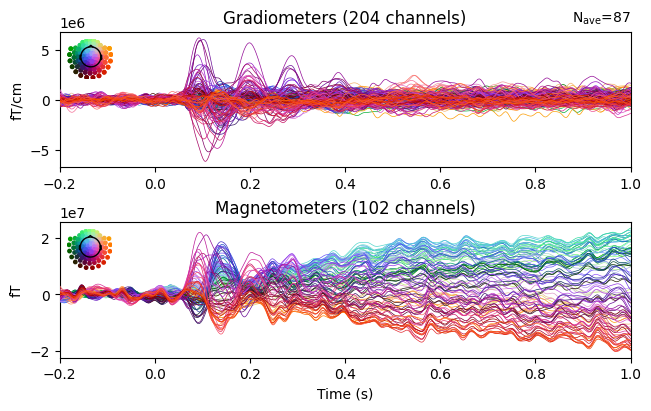

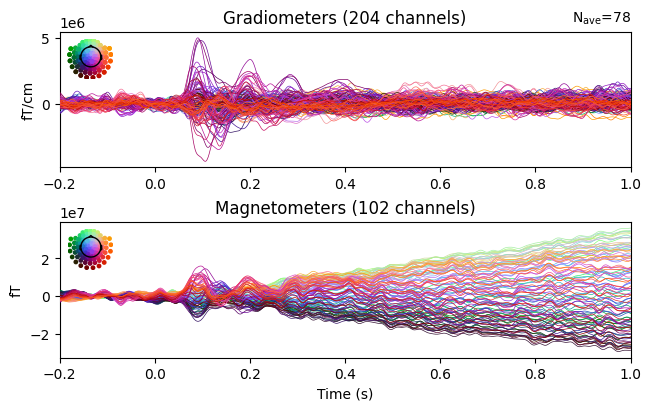

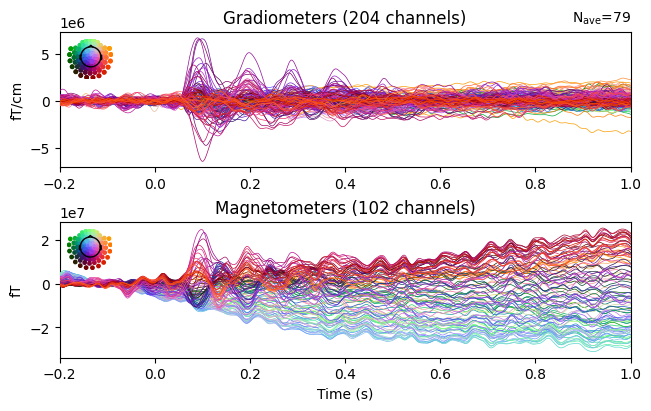

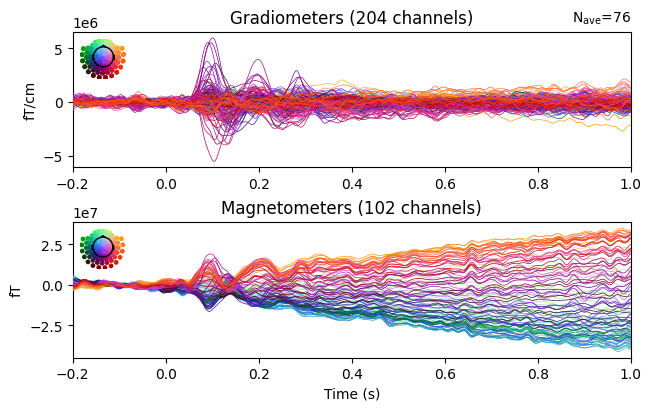

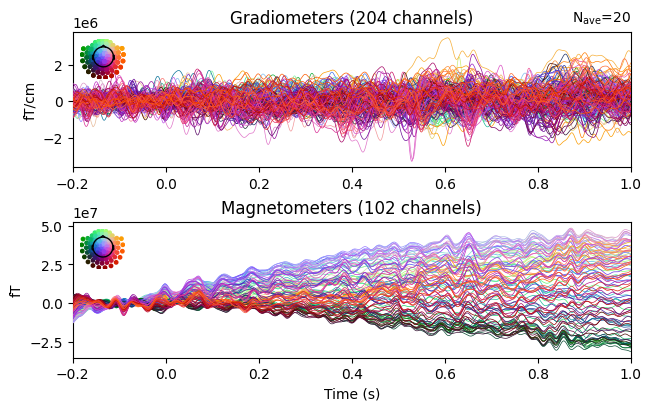

...

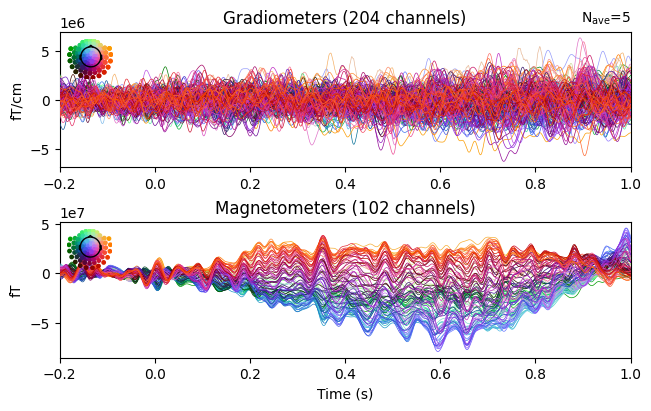

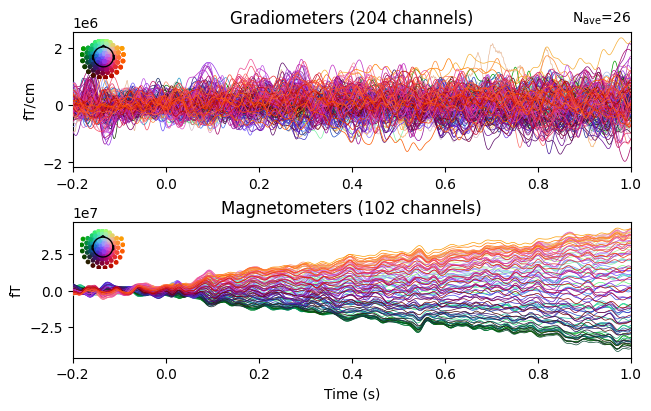

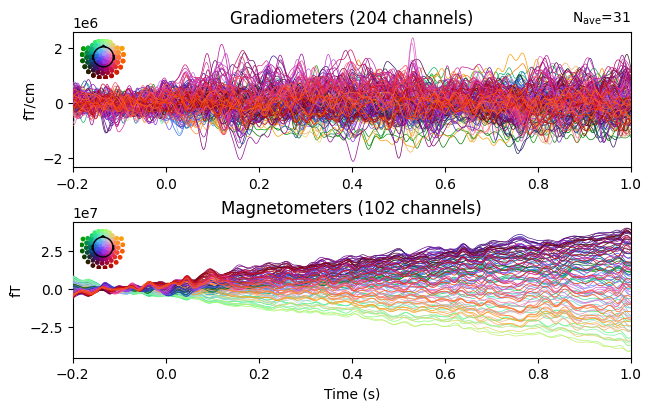

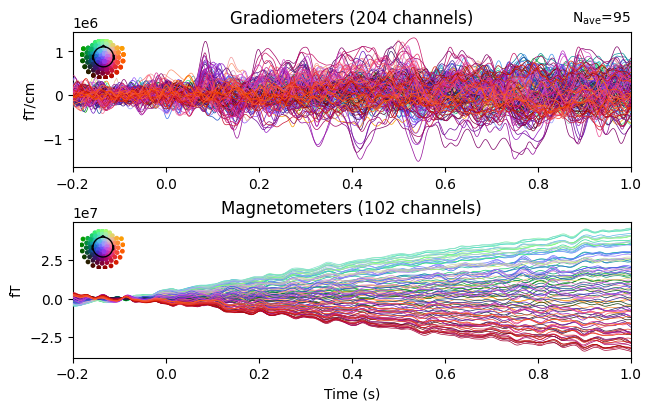

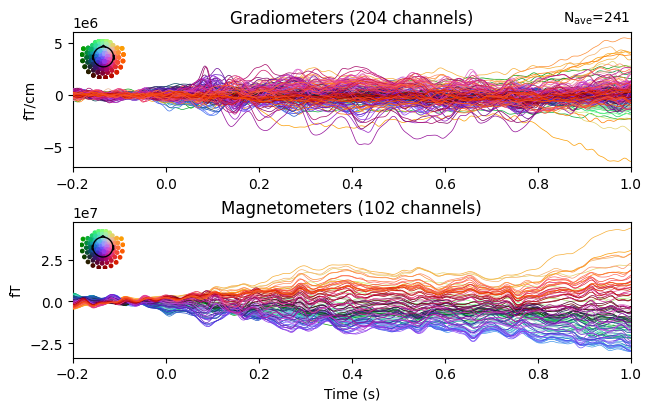

In [21]:
# %% EVOKED - AVERAGE - projections not applied

# 2 plots for each event_id
evokeds = list()
for event in event_id:
    
    evoked = epochs[event].average()
    evokeds.append(evoked)
    evoked.plot(window_title=evoked.comment)

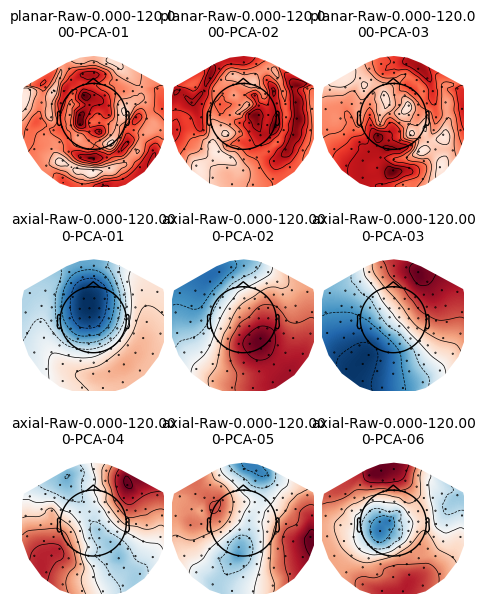

Created an SSP operator (subspace dimension = 9)
9 projection items activated
SSP projectors applied...


<Epochs | 2107 events (all good), -0.2 – 1 s (baseline -0.2 – 0 s), ~5.77 GB, data loaded,
 'Visual/Deck/One': 87
 'Visual/Deck/Two': 78
 'Visual/Deck/Three': 79
 'Visual/Deck/Four': 76
 'Visual/Win/One': 20
 'Visual/Win/Two': 41
 'Visual/Win/Three': 59
 'Visual/Win/Four': 172
 'Visual/Loss/One': 14
 'Visual/Loss/Two': 3
 and 10 more events ...>

In [22]:
# %% SSP PROJECTIONS
#SSP projectors are calculated to remove environmental noise from the MEG signal. Read more here: https://mne.tools/stable/auto_tutorials/preprocessing/45_projectors_background.html#tut-projectors-background
#Visualize the projectors that contain signal from outside the head
mne.viz.plot_projs_topomap(evoked.info["projs"], evoked.info)

#apply the projections
epochs.apply_proj()

#Commented out for now, as there are so many events - wait for the correct event structure
##Compare the plots with projections to those before without projections
#evokeds = list() 
#for event in event_id:

#    evoked = epochs[event].average()
#    evokeds.append(evoked)
#    evoked.plot(window_title=evoked.comment)

In [23]:
# %% ARRAY OF INTEREST FOR CLASSIFICATIION

X = epochs.get_data()
y = epochs.events[:, 2]   #Choose the last column

times = epochs[0].times # get time points for later

In [24]:
y

array([  2,  11,  11, ...,  11, 140, 240])

In [25]:
unique, frequency = np.unique(y, 
                              return_counts = True)


# print unique values array
print("Unique Values:", 
      unique)
 
# print frequency array
print("Frequency Values:",
      frequency)

Unique Values: [  1   2   3   4  11  12  13  14 110 120 130 140 210 211 220 221 230 231
 240 241]
Frequency Values: [ 87  78  79  76 632 148 224   5  26  31  95 241  20  14  41   3  59  52
 172  24]


In [26]:
#%% SIMPLE CLASSIFICATION

#Set functions for classification
import numpy as np

def get_indices(y, triggers):
    indices = list()
    for trigger_index, trigger in enumerate(y):
        if trigger in triggers:
            indices.append(trigger_index)
            
    return indices

def equalize_number_of_indices(): # write this yourself
    pass

def simple_classication(X, y, triggers, penalty='none', C=1.0):

    from sklearn.linear_model import LogisticRegression
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import cross_val_score, StratifiedKFold
    
    n_samples = X.shape[2]
    indices = get_indices(y, triggers)
    # equalize_number_of_indices()
    X = X[indices, :, :]
    y = y[indices]
    logr = LogisticRegression(penalty=penalty, C=C, solver='newton-cg')
    sc = StandardScaler() # especially necessary for sensor space as
                          ## magnetometers
                          # and gradiometers are on different scales 
                          ## (T and T/m)
    cv = StratifiedKFold()
    
    mean_scores = np.zeros(n_samples)
    
    for sample_index in range(n_samples):
        this_X = X[:, :, sample_index]
        sc.fit(this_X)
        this_X_std = sc.transform(this_X)
        scores = cross_val_score(logr, this_X_std, y, cv=cv)
        mean_scores[sample_index] = np.mean(scores)
        #print(sample_index)
        
    return mean_scores

def plot_classfication(times, mean_scores, title=None):

    plt.figure()
    plt.plot(times, mean_scores)
    plt.hlines(0.50, times[0], times[-1], linestyle='dashed', color='k')
    plt.ylabel('Proportion classified correctly')
    plt.xlabel('Time (s)')
    if title is None:
        pass
    else:
        plt.title(title)
    plt.show()


In [27]:
#%% COLLAPSE EVENTS (for visual and press/switch response)
#You can assign new values to the triggers, so that you can combine several triggers into a group

def collapse_events(y, new_value, old_values=list()):
    new_y = y.copy()
    for old_value in old_values:
        new_y[new_y == old_value] = new_value
    return new_y

#First, collapse all seeing decks
y_1 = collapse_events(y, 1, [1, 2, 3, 4])   #the old values get assigned the new value '1' and here it is looking at the decks
#Second, collapse all button press + switches
y_2 = collapse_events(y_1, 2, [11, 12, 13, 14, 110, 120, 130, 140])#the old values get assigned the new value '2' and here it is pressing a button, both selecting and switching


#First, collapse all win screens
y_3 = collapse_events(y, 1, [210, 220, 230, 240]) #all win screns
#Second, collapse all loss screens
y_4 = collapse_events(y_3, 2, [211, 221, 231, 241]) #all loss screens



In [29]:
#%% CLASSIFCATION - COLLAPSED EVENTS 1

sensor_visual_and_motor_events = simple_classication(X,
                                  y_2, triggers=[1, 2],
                                  penalty='l2', C=1e-3)

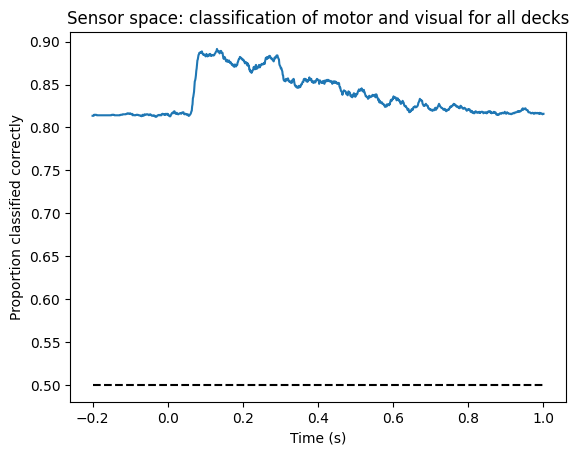

In [30]:
#%% PLOT COLLAPSED 1

plot_classfication(times, sensor_visual_and_motor_events,
                   title='Sensor space: classification of motor and visual for all decks')

In [31]:
#%% CLASSIFCATION - COLLAPSED EVENTS 2

sensor_visual_win_loss_screens = simple_classication(X,
                                  y_4, triggers=[1, 2],
                                  penalty='l2', C=1e-3)

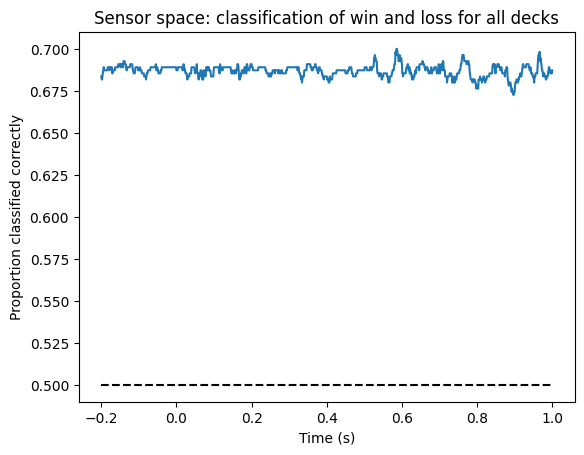

In [32]:
#%% PLOT COLLAPSED 2

plot_classfication(times, sensor_visual_win_loss_screens,
                   title='Sensor space: classification of win and loss for all decks')